# Rotten Tomatoes Movies Rating Prediction
source: https://platform.stratascratch.com/data-projects/rotten-tomatoes-movies-rating-prediction

In [112]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from ydata_profiling import ProfileReport
from catboost import CatBoostClassifier


### (1) Load datasets

In [30]:
movies = pd.read_csv("./datasets/rotten_tomatoes_movies.csv")
print(movies.info())

# Is the data set unique by rotten_tomatoes_link? - Yes
assert movies.drop_duplicates(["rotten_tomatoes_link"]).shape[0] == movies.shape[0]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17712 entries, 0 to 17711
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   rotten_tomatoes_link              17712 non-null  object 
 1   movie_title                       17712 non-null  object 
 2   movie_info                        17391 non-null  object 
 3   critics_consensus                 9134 non-null   object 
 4   content_rating                    17712 non-null  object 
 5   genres                            17693 non-null  object 
 6   directors                         17518 non-null  object 
 7   authors                           16170 non-null  object 
 8   actors                            17360 non-null  object 
 9   original_release_date             16546 non-null  object 
 10  streaming_release_date            17328 non-null  object 
 11  runtime                           17398 non-null  float64
 12  prod

In [27]:
critics = pd.read_csv("./datasets/rotten_tomatoes_critic_reviews_50k.csv")
critics.info()
critics

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   rotten_tomatoes_link  50000 non-null  object
 1   critic_name           48068 non-null  object
 2   top_critic            50000 non-null  bool  
 3   publisher_name        50000 non-null  object
 4   review_type           50000 non-null  object
 5   review_score          36409 non-null  object
 6   review_date           50000 non-null  object
 7   review_content        41195 non-null  object
dtypes: bool(1), object(7)
memory usage: 2.7+ MB


,rotten_tomatoes_link,critic_name,top_critic,publisher_name,review_type,review_score,review_date,review_content
0,m/0814255,Andrew L. Urban,False,Urban Cinefile,Fresh,NaN,2010-02-06,A fantasy adventure that fuses Greek mythology...
1,m/0814255,Louise Keller,False,Urban Cinefile,Fresh,NaN,2010-02-06,"Uma Thurman as Medusa, the gorgon with a coiff..."
2,m/0814255,NaN,False,FILMINK (Australia),Fresh,NaN,2010-02-09,With a top-notch cast and dazzling special eff...
3,m/0814255,Ben McEachen,False,Sunday Mail (Australia),Fresh,3.5/5,2010-02-09,Whether audiences will get behind The Lightnin...
4,m/0814255,Ethan Alter,True,Hollywood Reporter,Rotten,NaN,2010-02-10,What's really lacking in The Lightning Thief i...
...,...,...,...,...,...,...,...,...
49995,m/1110242-collateral_damage,Chris Hewitt,False,St. Paul Pioneer Press,Rotten,NaN,2002-02-07,The smarter an Arnold Schwarzenegger movie tri...
49996,m/1110242-collateral_damage,Nick Carter,False,Milwaukee Journal Sentinel,Rotten,NaN,2002-02-07,A relative letdown.
49997,m/1110242-collateral_damage,Gary Dowell,True,Dallas Morning News,Rotten,NaN,2002-02-07,The movie straddles the fence between escapism...
49998,m/1110242-collateral_damage,Walter Chaw,False,Film Freak Central,Rotten,0/4,2002-02-07,Enough similarities to Gymkata and Howie Long'...


### (2) Feature engineering

#### Should we include critics data set information in the analysis? 

In [83]:
critics_review = critics.groupby("rotten_tomatoes_link", as_index=False).agg(
    n_critics=("critic_name", "nunique"),
    n_top=("top_critic", "sum"),
    n_fresh=("review_type", lambda x: sum(np.where(x == "Fresh", 1, 0))),
    n_rotten=("review_type", lambda x: sum(np.where(x == "Rotten", 1, 0))),
)

critics_review

,rotten_tomatoes_link,n_critics,n_top,n_fresh,n_rotten
0,m/0814255,146,43,73,76
1,m/0878835,141,44,123,19
2,m/10,23,2,16,8
3,m/1000013-12_angry_men,51,6,54,0
4,m/1000079-20000_leagues_under_the_sea,25,5,24,3
...,...,...,...,...,...
1361,m/1109942-big_trouble,108,33,54,58
1362,m/1110008-sidewalks_of_new_york,90,26,53,41
1363,m/1110048-pornographer,7,0,3,5
1364,m/1110236-wash,45,19,4,46


The critics data set is largely incomplete, and the aggregated values do not agree with the movies data set.
I will not incorporate this data set in the analysis

In [97]:
movies2 = movies.merge(critics_review, on="rotten_tomatoes_link", how="left")
print(movies2.isna().sum())
movies2.query("tomatometer_top_critics_count != n_top and n_critics.notna()")[
    [
        "rotten_tomatoes_link",
        "n_critics",
        "tomatometer_top_critics_count",
        "tomatometer_fresh_critics_count",
        "tomatometer_rotten_critics_count",
        "n_top",
        "n_fresh",
        "n_rotten",
    ]
].head(5)

rotten_tomatoes_link                    0
movie_title                             0
movie_info                            321
critics_consensus                    8578
content_rating                          0
genres                                 19
directors                             194
authors                              1542
actors                                352
original_release_date                1166
streaming_release_date                384
runtime                               314
production_company                    499
tomatometer_status                     44
tomatometer_rating                     44
tomatometer_count                      44
audience_status                       448
audience_rating                       296
audience_count                        297
tomatometer_top_critics_count           0
tomatometer_fresh_critics_count         0
tomatometer_rotten_critics_count        0
n_critics                           16346
n_top                             

,rotten_tomatoes_link,n_critics,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,n_top,n_fresh,n_rotten
326,m/1011813-lady_vanishes,41.0,7,43,1,8.0,43.0,1.0
3486,m/10011050-lake_mungo,18.0,2,20,1,0.0,17.0,1.0
3635,m/1018994-silent_partner,7.0,1,4,2,2.0,5.0,2.0
4660,m/10009210-duchess_of_langeais,65.0,30,46,20,31.0,46.0,20.0
4884,m/1011818-ladykillers,23.0,3,26,0,2.0,25.0,0.0


In [98]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17712 entries, 12341 to 17671
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   rotten_tomatoes_link              17712 non-null  object 
 1   movie_title                       17712 non-null  object 
 2   movie_info                        17391 non-null  object 
 3   critics_consensus                 9134 non-null   object 
 4   content_rating                    17712 non-null  object 
 5   genres                            17693 non-null  object 
 6   directors                         17518 non-null  object 
 7   authors                           16170 non-null  object 
 8   actors                            17360 non-null  object 
 9   original_release_date             16546 non-null  object 
 10  streaming_release_date            17328 non-null  object 
 11  runtime                           17398 non-null  float64
 12  produ

In [ ]:
movies2 = movies.assign(
    pct_critic_fresh=lambda x: x.tomatometer_fresh_critics_count
    / (x.tomatometer_fresh_critics_count + x.tomatometer_rotten_critics_count)
)

### (3) EDA

In [100]:
movies2.describe()

,runtime,tomatometer_rating,tomatometer_count,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,pct_critic_fresh
count,17398.000000,17668.000000,17668.000000,17416.000000,1.741500e+04,17712.000000,17712.000000,17712.000000,17697.000000
mean,102.214048,60.884763,57.139801,60.554260,1.439401e+05,14.586326,36.374831,20.703139,0.609007
std,18.702511,28.443348,68.370047,20.543369,1.763577e+06,15.146349,52.601038,30.248435,0.284282
min,5.000000,0.000000,5.000000,0.000000,5.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,90.000000,38.000000,12.000000,45.000000,7.075000e+02,3.000000,6.000000,3.000000,0.384615
50%,99.000000,67.000000,28.000000,63.000000,4.277000e+03,8.000000,16.000000,8.000000,0.666667
75%,111.000000,86.000000,75.000000,78.000000,2.498800e+04,23.000000,44.000000,24.000000,0.857143
max,266.000000,100.000000,574.000000,100.000000,3.579764e+07,69.000000,497.000000,303.000000,1.000000


In [101]:
ProfileReport(movies2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [106]:
movies2.isna().sum()

rotten_tomatoes_link                   0
movie_title                            0
movie_info                           321
critics_consensus                   8578
content_rating                         0
genres                                19
directors                            194
authors                             1542
actors                               352
original_release_date               1166
streaming_release_date               384
runtime                              314
production_company                   499
tomatometer_status                    44
tomatometer_rating                    44
tomatometer_count                     44
audience_status                      448
audience_rating                      296
audience_count                       297
tomatometer_top_critics_count          0
tomatometer_fresh_critics_count        0
tomatometer_rotten_critics_count       0
pct_critic_fresh                      15
dtype: int64

In [107]:
numVars = movies2.select_dtypes(exclude="object").columns.to_list()
numVars

['runtime',
 'tomatometer_rating',
 'tomatometer_count',
 'audience_rating',
 'audience_count',
 'tomatometer_top_critics_count',
 'tomatometer_fresh_critics_count',
 'tomatometer_rotten_critics_count',
 'pct_critic_fresh']

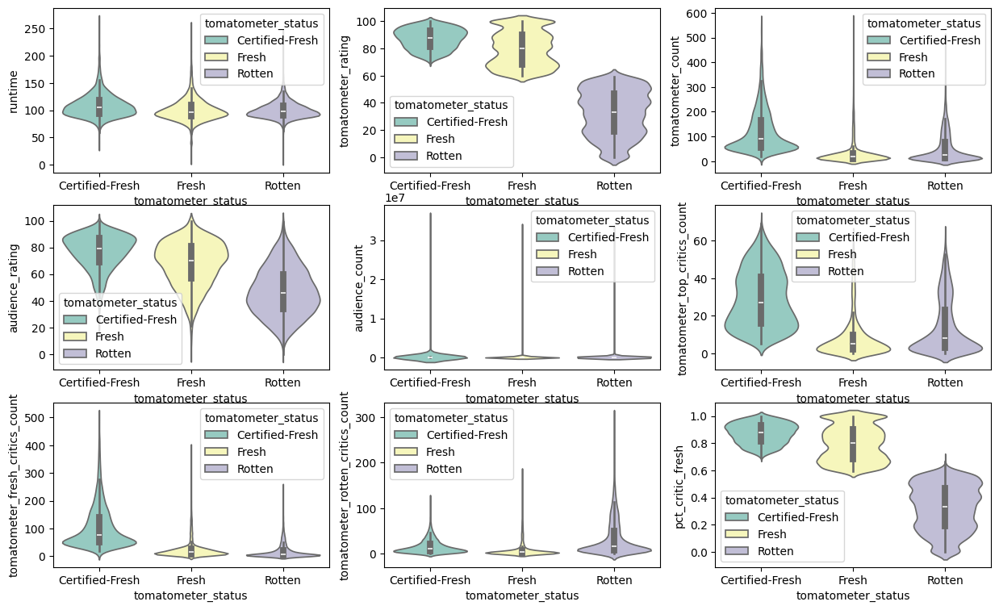

In [111]:
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(15, 9))
axes = axes.flatten()

movies2 = movies2.sort_values("tomatometer_status")
for n, i in enumerate(numVars):
    sns.violinplot(
        movies2,
        y=i,
        x="tomatometer_status",
        ax=axes[n],
        hue="tomatometer_status",
        palette="Set3",
    )


In [40]:
catVars = movies.select_dtypes("object").columns.to_list()

for var in catVars:
    print(f"{var} {movies[var].nunique()} : {movies[var].unique()[0:10]}")

rotten_tomatoes_link 17712 : ['m/0814255' 'm/0878835' 'm/10' 'm/1000013-12_angry_men'
 'm/1000079-20000_leagues_under_the_sea' 'm/10000_bc' 'm/1000121-39_steps'
 'm/1000123-310_to_yuma' 'm/10002008-charly' 'm/1000204-abraham_lincoln']
movie_title 17106 : ['Percy Jackson & the Olympians: The Lightning Thief' 'Please Give' '10'
 '12 Angry Men (Twelve Angry Men)' '20,000 Leagues Under The Sea'
 '10,000 B.C.' 'The 39 Steps' '3:10 to Yuma' 'Charly (A Heartbeat Away)'
 'Abraham Lincoln']
movie_info 17389 : ["Always trouble-prone, the life of teenager Percy Jackson (Logan Lerman) gets a lot more complicated when he learns he's the son of the Greek god Poseidon. At a training ground for the children of deities, Percy learns to harness his divine powers and prepare for the adventure of a lifetime: he must prevent a feud among the Olympians from erupting into a devastating war on Earth, and rescue his mother from the clutches of Hades, god of the underworld."
 "Kate (Catherine Keener) and her hu

### (4) catboost

In [113]:
numVars

['runtime',
 'tomatometer_rating',
 'tomatometer_count',
 'audience_rating',
 'audience_count',
 'tomatometer_top_critics_count',
 'tomatometer_fresh_critics_count',
 'tomatometer_rotten_critics_count',
 'pct_critic_fresh']

In [ ]:
targetVar = 'tomatometer_status'
numPred = 